In [1]:
# Preliminary imports
import pandas as pd
import numpy as np
import xgboost
from bokeh.charts import TimeSeries, show, output_notebook
from bokeh.layouts import gridplot
from bokeh.layouts import column
from datetime import datetime, date, time, timedelta
pd.set_option('display.max_columns', False)
output_notebook()

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Loading BokehJS ...

# Preprocessing part to fill missing values

# Beware: Do not run the following cell, this takes a lot of time!!!

In [3]:
# # Load the dataset
# data = pd.read_csv('train_2011_2012_2013.csv', sep = ';')

# # Function to transform dates
# def transform_date(x):
#     return(datetime.strptime(x, "%Y-%m-%d %H:%M") )

# # Clean the DATE column
# data['DATE'] = data['DATE'].apply(lambda x: x.replace(':00.000', ''))

# # Transform the DATE type
# data['DATE'] = data['DATE'].apply(transform_date)

# # Convert number of calls to integers
# data['CSPL_RECEIVED_CALLS'] = data['CSPL_RECEIVED_CALLS'].apply(int)

# # Sort w.r.t. dates
# data = data.sort(['DATE'], ascending= 1)

# lol = data[['DATE', 'ASS_ASSIGNMENT', 'CSPL_RECEIVED_CALLS']]
# lol=lol.sort(['DATE'], ascending= 1)

# test = pd.pivot_table(lol, values = 'CSPL_RECEIVED_CALLS',
#                       index = 'ASS_ASSIGNMENT', columns = 'DATE', aggfunc = np.sum).reset_index()

# data1 = pd.melt(test, id_vars='ASS_ASSIGNMENT')
# data1['CSPL_RECEIVED_CALLS'] = data1['value']
# data1 = data1[['DATE', 'ASS_ASSIGNMENT', 'CSPL_RECEIVED_CALLS']]

# #Change index to make it the current date
# data1.DATE=pd.to_datetime(data1.DATE,format='%f')
# data1=data1.set_index(pd.DatetimeIndex(data1['DATE']))

# #Création de la liste des centres
# listOfCenters=data1.ASS_ASSIGNMENT.unique()

# #If day off and NaN, then put the number of calls to 0
# for date in temp_hol:
#     print(date)
#     for center in listOfCenters:
#         data1.CSPL_RECEIVED_CALLS[data1['ASS_ASSIGNMENT']==center][date]=data1.CSPL_RECEIVED_CALLS[data1['ASS_ASSIGNMENT']==center][date].fillna(0)
        

# #Liste des centres pour lesquels on peut a priori compléter par la médiane sur le même jour/horaire du mois précédent
# temp_centers=['CAT','Domicile','Gestion - Accueil Telephonique','Gestion Assurances','Gestion Clients',
#              'Gestion DZ','Gestion Relation Clienteles','Japon','Manager','Mécanicien','Médical','Nuit',
#              'RENAULT','RTC','Regulation Medicale','SAP','Services','Tech. Axa','Tech. Inter','Tech. Total',
#              'Téléphonie']

# #On impute ensuite par la valeur de la semaine précédente à la même heure
# list_hours=[i for i in range(1,24)]
# list_minutes=[0,30]
# for heure in list_hours:
#     for minute in list_minutes:
#         print(str(heure)+':'+str(minute))
#         for center in temp_centers:
#             data1.CSPL_RECEIVED_CALLS[(data1['ASS_ASSIGNMENT']==center) & (data1.index.hour==heure) & 
#                                       (data1.index.minute==minute)] = data1.CSPL_RECEIVED_CALLS[(data1['ASS_ASSIGNMENT']==center) & (data1.index.hour==heure) & 
#                                       (data1.index.minute==minute)].fillna(data1.CSPL_RECEIVED_CALLS[(data1['ASS_ASSIGNMENT']==center) & (data1.index.hour==heure) & (data1.index.minute==minute)].shift(7))
            
# data2=data1.copy()
# for center in listOfCenters:
#     print(center)
#     data2.CSPL_RECEIVED_CALLS[data2['ASS_ASSIGNMENT']==center]=data2.CSPL_RECEIVED_CALLS[data2['ASS_ASSIGNMENT']==center].fillna(data2.CSPL_RECEIVED_CALLS[data2['ASS_ASSIGNMENT']==center].rolling(min_periods=1,window=8).median())
    
# #Interpolation for the rest of the data
# for center in listOfCenters:
#     print(center)
#     data2.CSPL_RECEIVED_CALLS[data2['ASS_ASSIGNMENT']==center]=data2.CSPL_RECEIVED_CALLS[data2['ASS_ASSIGNMENT']==center].interpolate(method='time')
    
# data2=data2.fillna(0) 

# #Save the dataset
# data2.to_csv("preprocessed.csv")

#### In the following, we will work with the dataset called "preprocessed".

## Loading of datasets

In [4]:
# We load the dataset resulting from the preprocessing part where we filled the NaNs
data = pd.read_csv('preprocessed.csv', sep = ';')

data1 = data.ix[:,1:]

In [5]:
# Function to transform dates
def transform_date(x):
    return(datetime.strptime(x, "%Y-%m-%d %H:%M:%S") )

# Transform the DATE type
data1['DATE'] = data1['DATE'].apply(transform_date)

# Convert number of calls to integers
data1['CSPL_RECEIVED_CALLS'] = data1['CSPL_RECEIVED_CALLS'].apply(int)

# Sort w.r.t. dates
data1 = data1.sort(['DATE'], ascending= 1)

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:12: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)


In [6]:
# Load the submission dataset
submission = pd.read_table('submission.txt')

# Do the same preprocessing as before
submission = submission.sort(['DATE'], ascending= 1)
submission['prediction'] = submission['prediction'].apply(int)
submission['DATE'] = submission['DATE'].apply(lambda x: x.replace('.000', ''))
submission['DATE'] = submission['DATE'].apply(transform_date)

submission = submission.reset_index()

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:5: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)


In [7]:
submission['CSPL_RECEIVED_CALLS']=submission['prediction']
submission.drop(['index','prediction'],axis=1,inplace=True)
submission.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS
0,2012-12-28,CMS,0
1,2012-12-28,Téléphonie,0
2,2012-12-28,Tech. Inter,0
3,2012-12-28,Tech. Axa,0
4,2012-12-28,Services,0


In [8]:
# Change index to make it the current date
data1.DATE=pd.to_datetime(data1.DATE,format='%f')
data1=data1.set_index(pd.DatetimeIndex(data1['DATE']))

In [9]:
# Creation of the list of centers
listOfCenters=data1.ASS_ASSIGNMENT.unique()
print(listOfCenters)

['CAT' 'Téléphonie' 'Tech. Total' 'Tech. Inter' 'Tech. Axa' 'Services'
 'SAP' 'Regulation Medicale' 'RENAULT' 'Prestataires' 'Nuit' 'Médical'
 'Mécanicien' 'Manager' 'RTC' 'Gestion Renault' 'Japon' 'Crises' 'Domicile'
 'Evenements' 'Gestion' 'Gestion - Accueil Telephonique' 'CMS'
 'Gestion Assurances' 'Gestion Clients' 'Gestion DZ'
 'Gestion Relation Clienteles' 'Gestion Amex']


In [10]:
# Creation of the list of holidays
listOfHolidays=[date(2011,1,1),date(2012,1,1),date(2013,1,1),
               date(2011,5,1),date(2012,5,1),date(2013,5,1),
               date(2011,5,8),date(2012,5,8),date(2013,5,8),
               date(2011,7,14),date(2012,7,14),date(2013,7,14),
               date(2011,8,15),date(2012,8,15),date(2013,8,15),
               date(2011,11,1),date(2012,11,1),date(2013,11,1),
               date(2011,11,11),date(2012,11,11),date(2013,11,11),
               date(2011,12,25),date(2012,12,25),date(2013,12,25),
               date(2011,4,25),date(2012,4,9),date(2013,4,1),
               date(2011,6,2),date(2012,5,17),date(2013,5,9),
               date(2011,6,13),date(2012,5,28),date(2013,5,20)]
temp_hol = ['2011-1-1','2012-1-1','2013-1-1','2011-5-1','2012-5-1','2013-5-1',
           '2011-5-8','2012-5-8','2013-5-8','2011-7-14','2012-7-14','2013-7-14',
           '2011-8-15','2012-8-15','2013-8-15','2011-11-1','2012-11-1','2013-11-1',
           '2011-11-11','2012-11-11','2013-11-11','2011-12-25','2012-12-25','2013-12-25',
           '2011-4-25','2012-4-9','2013-4-1','2011-6-2','2012-5-17','2013-5-9',
           '2011-6-13','2012-5-28','2013-5-20']

### Exploration

In [11]:
from matplotlib.pyplot import *
%matplotlib inline
style.use('ggplot')
import matplotlib.pyplot as plt

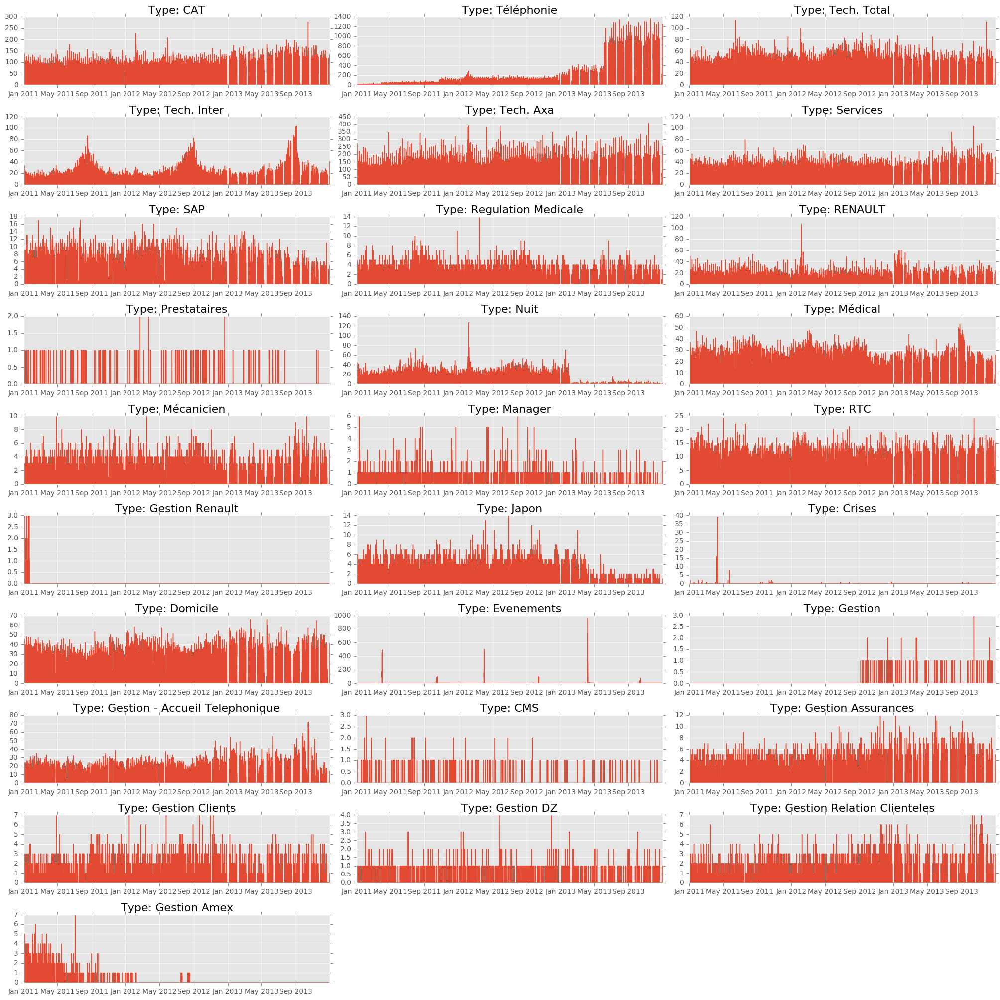

In [12]:
#Plot for the new dataset (preprocessed)
plt.figure(figsize=(20.0, 20.0))
cmptr=1
for i in range(len(listOfCenters)):
    plt.subplot(10,3,cmptr)
    plt.plot(data1[data1.ASS_ASSIGNMENT==listOfCenters[i]].CSPL_RECEIVED_CALLS)
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.title("Type: "+str(listOfCenters[i]),fontsize=16)
    cmptr+=1
plt.show()

In [13]:
#Création de la liste des jours fériés
listOfHolidays=[date(2011,1,1),date(2012,1,1),date(2013,1,1),
               date(2011,5,1),date(2012,5,1),date(2013,5,1),
               date(2011,5,8),date(2012,5,8),date(2013,5,8),
               date(2011,7,14),date(2012,7,14),date(2013,7,14),
               date(2011,8,15),date(2012,8,15),date(2013,8,15),
               date(2011,11,1),date(2012,11,1),date(2013,11,1),
               date(2011,11,11),date(2012,11,11),date(2013,11,11),
               date(2011,12,25),date(2012,12,25),date(2013,12,25),
               date(2011,4,25),date(2012,4,9),date(2013,4,1),
               date(2011,6,2),date(2012,5,17),date(2013,5,9),
               date(2011,6,13),date(2012,5,28),date(2013,5,20)]

In [14]:
data1['week_day']=data1.index.weekday
data1['time_since_start_of_day']=data1.index.hour+(data1.index.minute/60)
data1['month']=data1.index.month
data1['week-end']=(data1.week_day > 4).apply(int)
data1['night']=((data1['time_since_start_of_day'] < 8.5) | (data1['time_since_start_of_day'] > 19.5)).apply(int)
#Problème si on a d'autres années dans le leaderboard privé!
data1['temp_date']=data1.index.date
data1['holiday']=(data1['temp_date'].isin(listOfHolidays)).apply(int)

#Create dummies and remove one column of each+original variables
data2=pd.concat([data1,pd.get_dummies(data1.week_day,prefix='jour'),pd.get_dummies(data1.month,prefix='mois')],axis=1)

In [15]:
# Drop redundant variables
data2.drop(['week_day','month','temp_date','jour_0','mois_1'], axis=1, inplace=True)

## Visualisations

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:3: FutureWarning: order is deprecated, use sort_values(...)
  app.launch_new_instance()


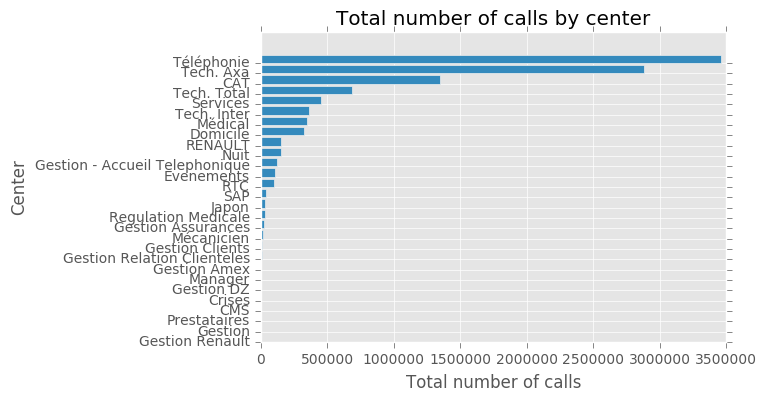

In [16]:
# Activity per center
counts_by_center = data2.groupby('ASS_ASSIGNMENT').aggregate(np.sum)
counts_by_center = counts_by_center['CSPL_RECEIVED_CALLS'].order(ascending = True)
# PLot it
# counts_by_center.index = data1['ASS_ASSIGNMENT'].unique()
plt.barh(np.arange(28), counts_by_center)
plt.yticks(np.arange(28), counts_by_center.index)
plt.xlabel('Total number of calls')
plt.ylabel('Center')
plt.title('Total number of calls by center')

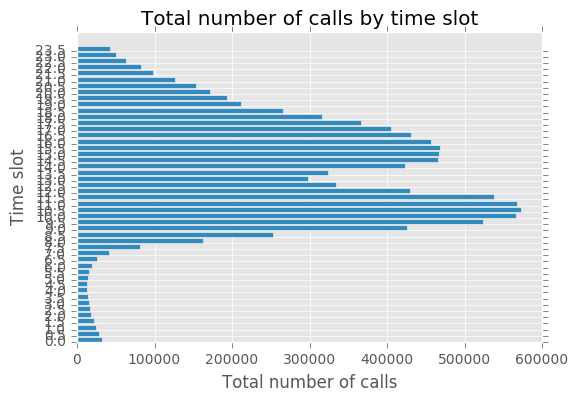

In [17]:
# Activity per time slot
counts_by_time = data2.groupby('time_since_start_of_day').aggregate(np.sum)
counts_by_time = counts_by_time['CSPL_RECEIVED_CALLS']
# Plot it
# counts_by_center.index = data1['ASS_ASSIGNMENT'].unique()
plt.barh(np.arange(len(counts_by_time.index)), counts_by_time)
plt.yticks(np.arange(len(counts_by_time.index)), counts_by_time.index)
plt.xlabel('Total number of calls')
plt.ylabel('Time slot')
plt.title('Total number of calls by time slot')

## Models

In [18]:
# Definition of the custom loss
def LinEx(y_true,y_hat,alpha=0.1):
    return np.mean(np.exp(alpha*(y_true-y_hat))-alpha*(y_true-y_hat)-1)

In [19]:
# Create two more features: the number of incoming calls one week before, and the mean value of the calls from the week W - 2

data2['last_nb_of_calls']=data2.groupby('ASS_ASSIGNMENT')['CSPL_RECEIVED_CALLS'].shift(336)
roll_avg=lambda x: x.rolling(336).mean()
data2['past_7_days_avg']=data2.groupby('ASS_ASSIGNMENT')['last_nb_of_calls'].transform(roll_avg)

In [20]:
# Some imports for the models
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.model_selection import TimeSeriesSplit

### Cross-validation with Time-series-specific K-Fold

The way to carry out cross-validation has to be adapted to the specific case of Time Series. Following the paper from Bergmeir et Al. (http://robjhyndman.com/papers/cv-wp.pdf), we use its implementation on Scikit learn with sklearn.model_selection.TimeSeriesSplit 

In [21]:
# Creation du dataframe qui va récupérer les prédictions
data_pred=pd.DataFrame()

# Drop NA from data2
readyToTrain = data2.dropna(axis=0,how="any")

print('Résultats')
print('_________')
print('')
for center in listOfCenters:
    
    ##########################
    #### Train-test-split ####
    ##########################
    
    data_temp=readyToTrain[readyToTrain['ASS_ASSIGNMENT']==center]
    tscv = TimeSeriesSplit(n_splits=10)
    
    ####################################
    #### Instantiation of the model ####
    ####################################
    
    model = Lasso(alpha=1)
    
    # To store LinEx scores:
    linex_scores = []
    
    for train_index, test_index in tscv.split(data_temp):
        train_X = data_temp.ix[train_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        test_X = data_temp.ix[test_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        train_y = data_temp['CSPL_RECEIVED_CALLS'].ix[train_index]
        test_y = data_temp['CSPL_RECEIVED_CALLS'].ix[test_index]
        
        
        model.fit(train_X,train_y)
        y_pred = model.predict(test_X)
        linex_scores.append(LinEx(test_y,y_pred))
        
    print(str(center)+" : "+str(round(np.mean(linex_scores),2))+' +/- '+str(round(np.std(linex_scores)*2,2)))

Résultats
_________

CAT : 12002.68 +/- 56917.16
Téléphonie : 9.75615913132e+51 +/- 5.85071356957e+52
Tech. Total : 3.28 +/- 9.2
Tech. Inter : 1.55 +/- 7.81
Tech. Axa : 260563490.44 +/- 785213829.52
Services : 1.22 +/- 3.56
SAP : 0.01 +/- 0.01
Regulation Medicale : 0.0 +/- 0.0
RENAULT : 0.26 +/- 0.66
Prestataires : 0.0 +/- 0.0
Nuit : 0.69 +/- 3.25
Médical : 0.26 +/- 0.44
Mécanicien : 0.0 +/- 0.0
Manager : 0.0 +/- 0.0
RTC : 0.04 +/- 0.02
Gestion Renault : 0.0 +/- 0.0
Japon : 0.01 +/- 0.0
Crises : 0.0 +/- 0.0
Domicile : 0.61 +/- 0.94
Evenements : 1.28164427716e+37 +/- 7.68986566293e+37
Gestion : 0.0 +/- 0.0
Gestion - Accueil Telephonique : 0.27 +/- 0.57
CMS : 0.0 +/- 0.0
Gestion Assurances : 0.01 +/- 0.0
Gestion Clients : 0.0 +/- 0.0
Gestion DZ : 0.0 +/- 0.0
Gestion Relation Clienteles : 0.0 +/- 0.0
Gestion Amex : 0.0 +/- 0.0


We notice that our algorithm behave badly with a few centers.

In [22]:
# List of centers badly predicted by our algorithm
listOfBad=['CAT','Téléphonie','Tech. Total','Tech. Inter','Tech. Axa','Services','Evenements']

In [23]:
data_pred1=data_pred.copy()

## Let's have a look on the centers we fail to predict accurately, and find the best Lasso parameter $\alpha$ for each of them

Tech. Total

In [24]:
data_pred=pd.DataFrame()

data_temp=readyToTrain[readyToTrain['ASS_ASSIGNMENT']=="Tech. Total"]
tscv = TimeSeriesSplit(n_splits=5)

#Model
model=Lasso()
alphas=np.linspace(10**-3,2,num=30)
linex_scores = []

for alpha in alphas:
    model.alpha=alpha
    temp1=[]
    for train_index, test_index in tscv.split(data_temp):
        train_X = data_temp.ix[train_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        test_X = data_temp.ix[test_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        train_y = data_temp['CSPL_RECEIVED_CALLS'].ix[train_index]
        test_y = data_temp['CSPL_RECEIVED_CALLS'].ix[test_index]
        
        model.fit(train_X,train_y)
        y_pred = model.predict(test_X)
        temp1.append(LinEx(test_y,y_pred))
    linex_scores.append(temp1)

In [25]:
linex_means=[]
linex_minci=[]
linex_maxci=[]
for i in range(len(linex_scores)):
    linex_means.append(np.mean(linex_scores[i]))
    linex_minci.append(linex_means[i]-2*np.std(linex_scores[i]))
    linex_maxci.append(linex_means[i]+np.std(linex_scores[i]))

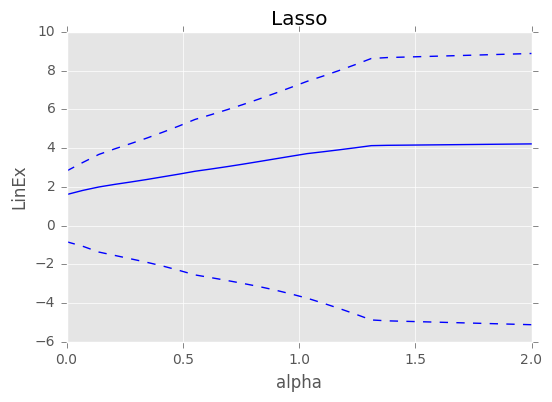

In [26]:
plt.figure()
plt.plot(alphas,linex_means,color='blue')
plt.plot(alphas,linex_minci,'--',color='blue')
plt.plot(alphas,linex_maxci,'--',color='blue')
plt.xlabel('alpha',fontsize=12)
plt.ylabel('LinEx',fontsize=12)
plt.title('Lasso')
plt.show()

Hence, for Tech. Total, we will use $\alpha = 0.001$

Tech. Inter

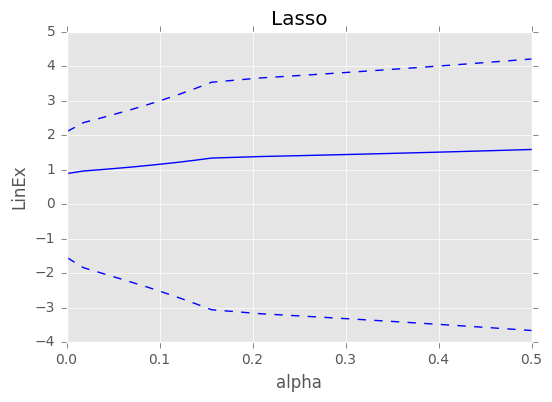

In [27]:
data_pred=pd.DataFrame()

data_temp=readyToTrain[readyToTrain['ASS_ASSIGNMENT']=="Tech. Inter"]
tscv = TimeSeriesSplit(n_splits=5)

#Model
model=Lasso()
alphas=np.linspace(10**-3,.5,num=30)
linex_scores = []

for alpha in alphas:
    model.alpha=alpha
    temp1=[]
    for train_index, test_index in tscv.split(data_temp):
        train_X = data_temp.ix[train_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        test_X = data_temp.ix[test_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        train_y = data_temp['CSPL_RECEIVED_CALLS'].ix[train_index]
        test_y = data_temp['CSPL_RECEIVED_CALLS'].ix[test_index]
        
        model.fit(train_X,train_y)
        y_pred = model.predict(test_X)
        temp1.append(LinEx(test_y,y_pred))
    linex_scores.append(temp1)
    
linex_means=[]
linex_minci=[]
linex_maxci=[]
for i in range(len(linex_scores)):
    linex_means.append(np.mean(linex_scores[i]))
    linex_minci.append(linex_means[i]-2*np.std(linex_scores[i]))
    linex_maxci.append(linex_means[i]+np.std(linex_scores[i]))
    
plt.figure()
plt.plot(alphas,linex_means,color='blue')
plt.plot(alphas,linex_minci,'--',color='blue')
plt.plot(alphas,linex_maxci,'--',color='blue')
plt.xlabel('alpha',fontsize=12)
plt.ylabel('LinEx',fontsize=12)
plt.title('Lasso')
plt.show()

We will also take $\alpha = 0.001$

Tech. Axa

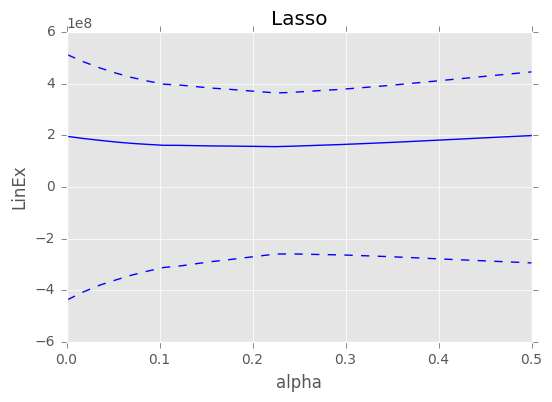

In [28]:
data_pred=pd.DataFrame()

data_temp=readyToTrain[readyToTrain['ASS_ASSIGNMENT']=="Tech. Axa"]
tscv = TimeSeriesSplit(n_splits=5)

#Model
model=Lasso()
alphas=np.linspace(10**-3,.5,num=30)
linex_scores = []

for alpha in alphas:
    model.alpha=alpha
    temp1=[]
    for train_index, test_index in tscv.split(data_temp):
        train_X = data_temp.ix[train_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        test_X = data_temp.ix[test_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        train_y = data_temp['CSPL_RECEIVED_CALLS'].ix[train_index]
        test_y = data_temp['CSPL_RECEIVED_CALLS'].ix[test_index]
        
        model.fit(train_X,train_y)
        y_pred = model.predict(test_X)
        temp1.append(LinEx(test_y,y_pred))
    linex_scores.append(temp1)
    
linex_means=[]
linex_minci=[]
linex_maxci=[]
for i in range(len(linex_scores)):
    linex_means.append(np.mean(linex_scores[i]))
    linex_minci.append(linex_means[i]-2*np.std(linex_scores[i]))
    linex_maxci.append(linex_means[i]+np.std(linex_scores[i]))
    
plt.figure()
plt.plot(alphas,linex_means,color='blue')
plt.plot(alphas,linex_minci,'--',color='blue')
plt.plot(alphas,linex_maxci,'--',color='blue')
plt.xlabel('alpha',fontsize=12)
plt.ylabel('LinEx',fontsize=12)
plt.title('Lasso')
plt.show()

Here, we will take $\alpha = 0.2$

Services

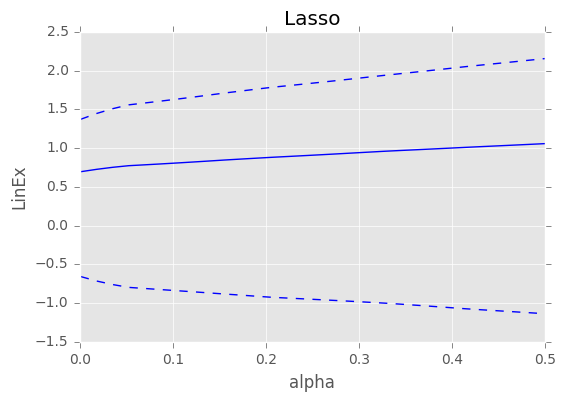

In [29]:
data_pred=pd.DataFrame()

data_temp=readyToTrain[readyToTrain['ASS_ASSIGNMENT']=="Services"]
tscv = TimeSeriesSplit(n_splits=5)

#Model
model=Lasso()
alphas=np.linspace(10**-3,.5,num=30)
linex_scores = []

for alpha in alphas:
    model.alpha=alpha
    temp1=[]
    for train_index, test_index in tscv.split(data_temp):
        train_X = data_temp.ix[train_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        test_X = data_temp.ix[test_index].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        train_y = data_temp['CSPL_RECEIVED_CALLS'].ix[train_index]
        test_y = data_temp['CSPL_RECEIVED_CALLS'].ix[test_index]
        
        model.fit(train_X,train_y)
        y_pred = model.predict(test_X)
        temp1.append(LinEx(test_y,y_pred))
    linex_scores.append(temp1)
    
linex_means=[]
linex_minci=[]
linex_maxci=[]
for i in range(len(linex_scores)):
    linex_means.append(np.mean(linex_scores[i]))
    linex_minci.append(linex_means[i]-2*np.std(linex_scores[i]))
    linex_maxci.append(linex_means[i]+np.std(linex_scores[i]))
    
plt.figure()
plt.plot(alphas,linex_means,color='blue')
plt.plot(alphas,linex_minci,'--',color='blue')
plt.plot(alphas,linex_maxci,'--',color='blue')
plt.xlabel('alpha',fontsize=12)
plt.ylabel('LinEx',fontsize=12)
plt.title('Lasso')
plt.show()

We will take $alpha = 0.001$

## Predictions for submission.txt

In [30]:
# Creation of the dataframe to store predictions
data_pred=pd.DataFrame()

for center in listOfCenters:
    
    ##########################
    #### Train-test-split ####
    ##########################
    
    train_X=data2[data2['ASS_ASSIGNMENT']==center]['2011-02':'2012-11'].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
    train_y=data2[data2['ASS_ASSIGNMENT']==center]['2011-02':'2012-11']['CSPL_RECEIVED_CALLS']
    
    test_X=data2[data2['ASS_ASSIGNMENT']==center]['2012-12':'2013'].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
    test_y=data2[data2['ASS_ASSIGNMENT']==center]['2012-12':'2013']['CSPL_RECEIVED_CALLS']
    
    ####################################
    #### Instantiation of the model ####
    ####################################
    
    model = Lasso(alpha=1)
    
    if (center in ['Tech. Total', 'Tech. Inter', 'Services']):
        model.alpha = 0.001 
    elif (center == 'Tech. Axa'):
        model.alpha = 0.2
    
    model.fit(train_X,train_y)
    y_pred=model.predict(test_X)
    y_pred = y_pred*2.3
    y_pred = np.ceil(y_pred)
    
    temp=pd.DataFrame(data={'DATE':data2[data2['ASS_ASSIGNMENT']==center]['2012-12':'2013']['DATE'],
                      'ASS_ASSIGNMENT':data2[data2['ASS_ASSIGNMENT']==center]['2012-12':'2013']['ASS_ASSIGNMENT'],
                      'prediction':y_pred})
    data_pred=data_pred.append(temp)
    
    print('Center ', center, ' has been processed')

Center  CAT  has been processed
Center  Téléphonie  has been processed
Center  Tech. Total  has been processed
Center  Tech. Inter  has been processed
Center  Tech. Axa  has been processed
Center  Services  has been processed
Center  SAP  has been processed
Center  Regulation Medicale  has been processed
Center  RENAULT  has been processed
Center  Prestataires  has been processed
Center  Nuit  has been processed
Center  Médical  has been processed
Center  Mécanicien  has been processed
Center  Manager  has been processed
Center  RTC  has been processed
Center  Gestion Renault  has been processed
Center  Japon  has been processed
Center  Crises  has been processed
Center  Domicile  has been processed
Center  Evenements  has been processed
Center  Gestion  has been processed
Center  Gestion - Accueil Telephonique  has been processed
Center  CMS  has been processed
Center  Gestion Assurances  has been processed
Center  Gestion Clients  has been processed
Center  Gestion DZ  has been proce

### Save the results

In [31]:
merge = pd.merge(left=submission, right=data_pred, how='left', on = ['DATE', 'ASS_ASSIGNMENT'])
merge1 = merge.copy()
merge1.prediction[merge1.prediction<0]=0
merge1.drop(['CSPL_RECEIVED_CALLS'],axis=1,inplace=True)
sub=merge1

with open("subVF.txt", "w", encoding='utf-8') as text_file:
    text_file.write('DATE'+'\t'+'ASS_ASSIGNMENT'+'\t'+'prediction'+'\n')
    for row in sub.values:
        text_file.write(str(row[0])+'.000'+'\t'+row[1]+'\t'+str(row[2])+'\n')

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


## Visualisation of the predictions

### On Téléphonie

In [32]:
merge2=merge1.copy()
#Change index to make it the current date
merge2.DATE=pd.to_datetime(merge2.DATE,format='%f')
merge2=merge2.set_index(pd.DatetimeIndex(merge2['DATE']))

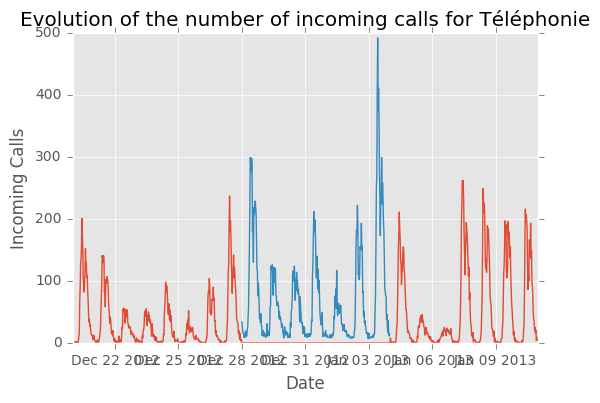

In [33]:
plt.plot(data2[data2["ASS_ASSIGNMENT"]=="Téléphonie"]['2012-12-20':'2013-1-10'].CSPL_RECEIVED_CALLS)
plt.plot(merge2[merge2["ASS_ASSIGNMENT"]=="Téléphonie"]['2012-12-20':'2013-1-10'].prediction)
plt.xlabel('Date')
plt.ylabel('Incoming Calls')
plt.title('Evolution of the number of incoming calls for Téléphonie')

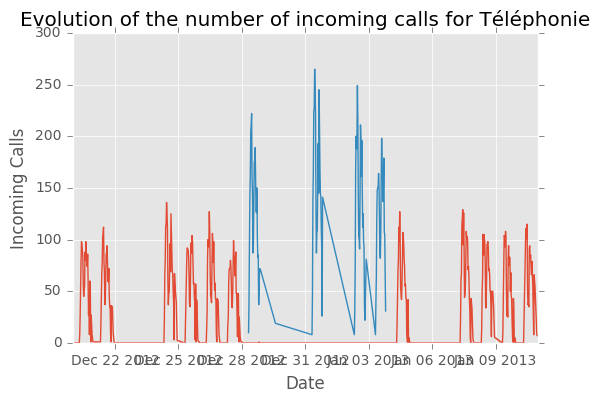

In [34]:
plt.plot(data2[data2["ASS_ASSIGNMENT"]=="CAT"]['2012-12-20':'2013-1-10'].CSPL_RECEIVED_CALLS)
plt.plot(merge2[merge2["ASS_ASSIGNMENT"]=="CAT"]['2012-12-20':'2013-1-10'].prediction)
plt.xlabel('Date')
plt.ylabel('Incoming Calls')
plt.title('Evolution of the number of incoming calls for Téléphonie')

## Visualisations for all centers for several weeks to predict

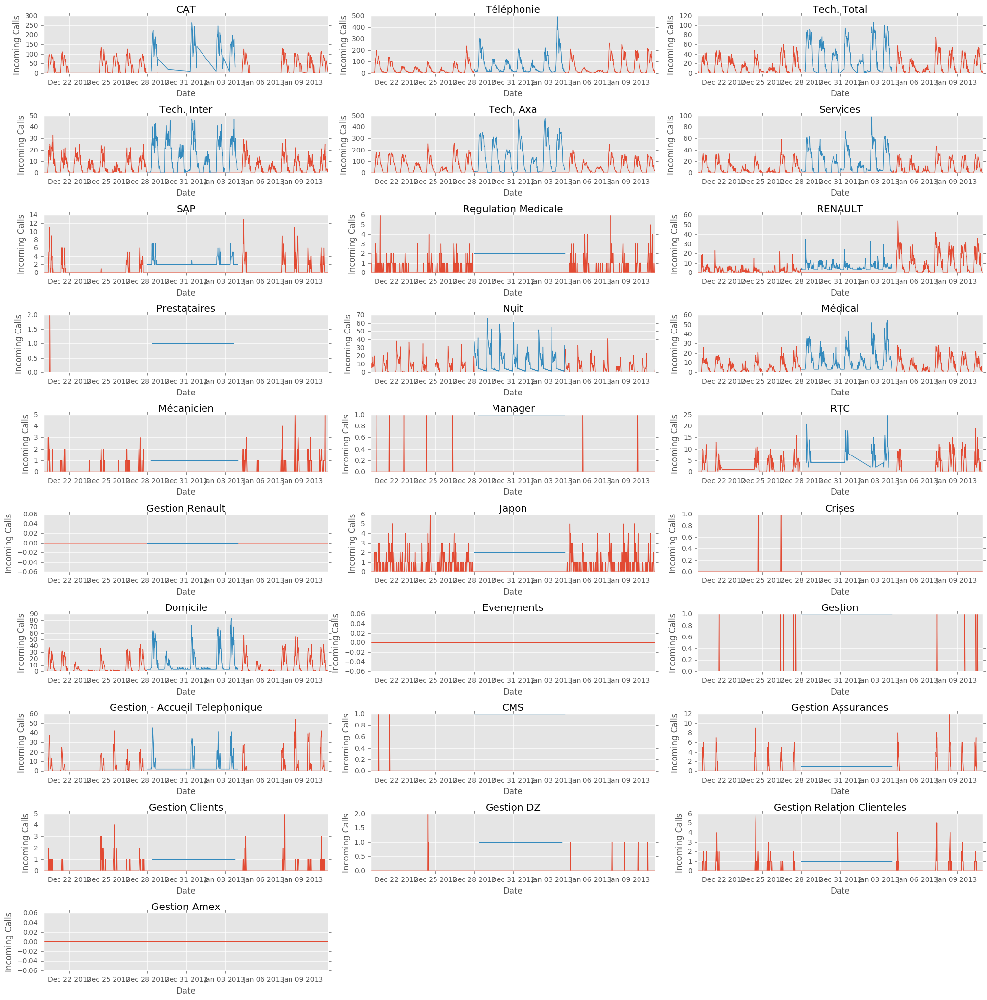

In [35]:
# First week to predict

plt.figure(figsize=(20.0, 20.0))
cmptr=1
for center in listOfCenters:
    plt.subplot(10,3,cmptr)
    plt.plot(data2[data2["ASS_ASSIGNMENT"]==center]['2012-12-20':'2013-1-10'].CSPL_RECEIVED_CALLS)
    plt.plot(merge2[merge2["ASS_ASSIGNMENT"]==center]['2012-12-20':'2013-1-10'].prediction)
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.title(str(center))
    plt.xlabel('Date')
    plt.ylabel('Incoming Calls')    
    cmptr+=1
plt.show()

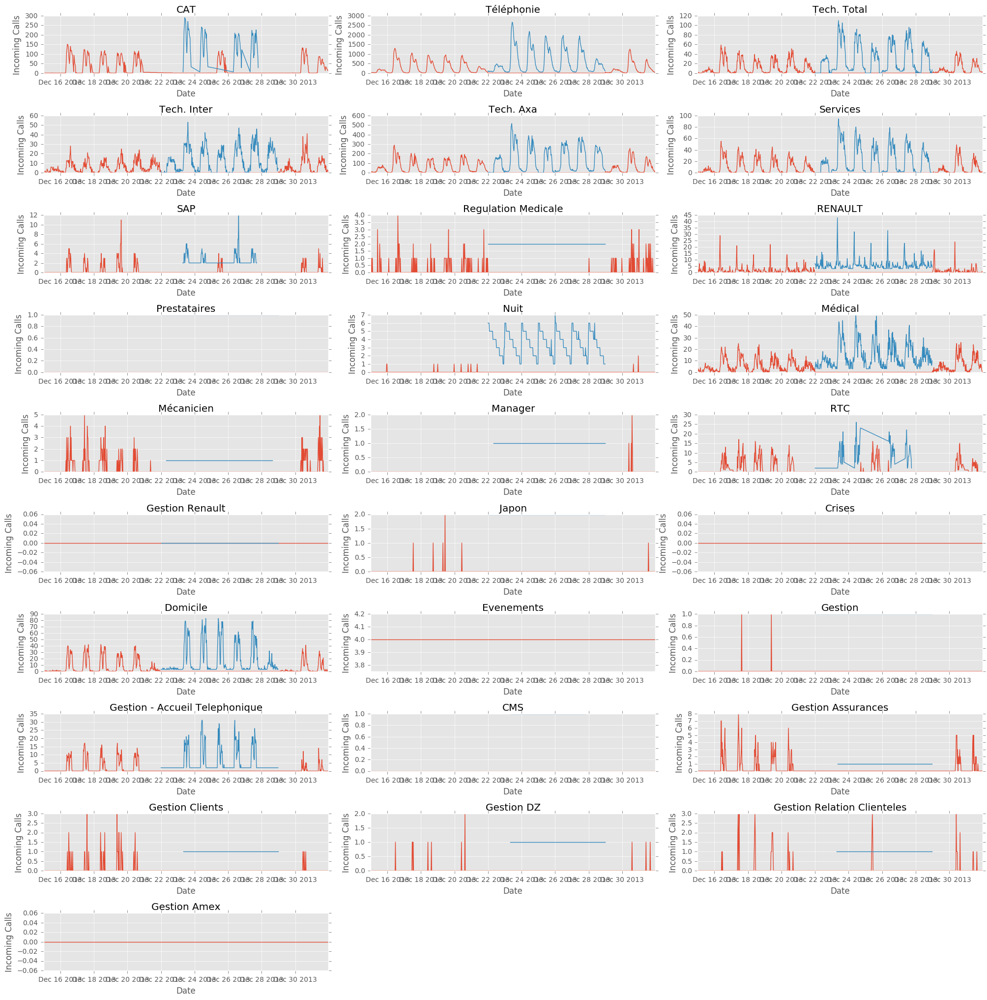

In [36]:
## Last week to predict

plt.figure(figsize=(20.0, 20.0))
cmptr=1
for center in listOfCenters:
    plt.subplot(10,3,cmptr)
    plt.plot(data2[data2["ASS_ASSIGNMENT"]==center]['2013-12-15':'2013-12-31'].CSPL_RECEIVED_CALLS)
    plt.plot(merge2[merge2["ASS_ASSIGNMENT"]==center]['2013-12-15':'2013-12-31'].prediction)
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.title(str(center))
    plt.xlabel('Date')
    plt.ylabel('Incoming Calls')    
    cmptr+=1
plt.show()

## Other methods tested: Self-Training

#### Specific models for "Téléphonie" center

We are going to try a self-learning algorithm in order to catpure the specific behaviour of the center "Téléphonie". We want to model to shift of of behaviour in 2013.

In [37]:
from bokeh.charts import TimeSeries, show, output_notebook
from bokeh.layouts import gridplot
from bokeh.layouts import column
from sklearn import linear_model
from dateutil.relativedelta import relativedelta
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

In [38]:
data = data2.copy()
submission.index = submission.DATE
data_tel = data[data.ASS_ASSIGNMENT == 'Téléphonie']
print('Dimension:' , data_tel.shape)


data_tel['past_7_days_avg']=pd.rolling_mean(data_tel['CSPL_RECEIVED_CALLS'].shift(336),336)
data_tel['last_nb_of_calls']=data_tel['CSPL_RECEIVED_CALLS'].shift(336)

pred_index = np.unique(submission.index)
standard_len = pred_index[1] - pred_index[0]
sep_date = pd.DataFrame(np.zeros((12,2)))
sep_date.iloc[0,0] = pred_index[0] 
sep_date.iloc[11,1] = pred_index[len(pred_index)-1] 
sep_date.columns = ['Begin','End']
j = 0
for i in range(1,len(pred_index)):
    if(pred_index[i]-pred_index[i-1] > 4*standard_len):
        j = j+1
        sep_date.iloc[j,0] = pred_index[i]
        sep_date.iloc[j-1,1] = pred_index[i-1]
                        
sep_date   

Dimension: (52525, 26)


C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(center=False,window=336).mean()
C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Begin,End
0,2012-12-28 00:00:00,2013-01-03 23:30:00
1,2013-02-02 00:00:00,2013-02-08 23:30:00
2,2013-03-06 00:00:00,2013-03-12 23:30:00
3,2013-04-10 00:00:00,2013-04-16 23:30:00
4,2013-05-13 00:30:00,2013-05-19 23:30:00
5,2013-06-12 00:00:00,2013-06-18 23:30:00
6,2013-07-16 00:00:00,2013-07-22 23:30:00
7,2013-08-15 00:00:00,2013-08-21 23:30:00
8,2013-09-14 00:00:00,2013-09-20 23:30:00
9,2013-10-18 00:00:00,2013-10-24 23:30:00


In [39]:
a = pd.DataFrame(data_tel['CSPL_RECEIVED_CALLS'].copy())
a['date'] = a.index
data = dict([('Calls', a['CSPL_RECEIVED_CALLS']),('Date', a['date'])])
p = TimeSeries(data, x='Date', plot_width=600, plot_height=600)
show(p)

In [40]:
def self_training(X,sep_date):   
    
    update_X = X.copy()
    
    rf = RandomForestRegressor(n_estimators=100)

    
    begin_train = sep_date.iloc[0,0] + relativedelta(years=-1)
    end_train = sep_date.iloc[0,0]  + relativedelta(minutes=-30)
    
    begin_test = sep_date.iloc[0,0]
    end_test = sep_date.iloc[0,1]
    
    X_test = update_X.ix[begin_test:end_test].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
    
    X_train = update_X.ix[begin_train:end_train].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
    y_train = update_X.ix[begin_train:end_train]['CSPL_RECEIVED_CALLS']

 
    rf.fit(X_train,y_train)
    update_X.ix[begin_test:end_test]['CSPL_RECEIVED_CALLS'] = rf.predict(X_test)
    
    for i in range(1,sep_date.shape[0]):

        begin_train = sep_date.iloc[0,0] + relativedelta(years=-1)
        end_train = sep_date.iloc[i,0]  + relativedelta(minutes=-30)
        
        begin_test = sep_date.iloc[i,0]
        end_test = sep_date.iloc[i,1]

        X_test = update_X.ix[begin_test:end_test].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        
        X_train = update_X.ix[begin_train:end_train].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        y_train = update_X.ix[begin_train:end_train]['CSPL_RECEIVED_CALLS']

        rf.fit(X_train,y_train)
        update_X.loc[begin_test:end_test,'CSPL_RECEIVED_CALLS'] = rf.predict(X_test)
    
    return(update_X)

In [41]:
pred = self_training(data_tel,sep_date)

a = pd.DataFrame(pred['CSPL_RECEIVED_CALLS'].copy())
a['date'] = a.index
data = dict([('Calls', a['CSPL_RECEIVED_CALLS']),('Date', a['date'])])
p = TimeSeries(data, x='Date', plot_width=600, plot_height=600)
show(p)

C:\Users\Peter martigny\Anaconda3\envs\py35\lib\site-packages\ipykernel\__main__.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


The results are not really statisfying. An other idea could be to train the model only on the last month to take into account the shift over 2013.

In [42]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

def training_last_month(X,sep_date):   
    
    update_X = X.copy()
    
    rf = RandomForestRegressor(n_estimators=100)

    begin_train = sep_date.iloc[0,0] + relativedelta(years=-1)
    end_train = sep_date.iloc[0,0]  + relativedelta(minutes=-30)
    
    begin_test = sep_date.iloc[0,0]
    end_test = sep_date.iloc[0,1]

    X_test = update_X.ix[begin_test:end_test].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)

    X_train = update_X.ix[begin_train:end_train].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
    y_train = update_X.ix[begin_train:end_train]['CSPL_RECEIVED_CALLS']

    rf.fit(X_train,y_train)
    update_X.loc[begin_test:end_test,'CSPL_RECEIVED_CALLS'] = rf.predict(X_test)
    
    for i in range(1,sep_date.shape[0]):

        begin_train = sep_date.iloc[i-1,1] + relativedelta(minutes=+30)
        #begin_train = sep_date.iloc[0,0] + relativedelta(years=-1)
        end_train = sep_date.iloc[i,0]  + relativedelta(minutes=-30)
        
        begin_test = sep_date.iloc[i,0]
        end_test = sep_date.iloc[i,1]

        X_test = update_X.ix[begin_test:end_test].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)

        X_train = update_X.ix[begin_train:end_train].drop(['DATE','ASS_ASSIGNMENT','CSPL_RECEIVED_CALLS'],1)
        
        y_train = update_X.ix[begin_train:end_train]['CSPL_RECEIVED_CALLS']

        rf.fit(X_train,y_train)
        aa = rf.predict(X_test)
        update_X.loc[begin_test:end_test,'CSPL_RECEIVED_CALLS'] = aa
        
    return(update_X)

In [43]:
pred = training_last_month(data_tel,sep_date)

a = pd.DataFrame(pred['CSPL_RECEIVED_CALLS'].copy())
a['date'] = a.index
data = dict([('Calls', a['CSPL_RECEIVED_CALLS']),('Date', a['date'])])
p = TimeSeries(data, x='Date', plot_width=600, plot_height=600)
show(p)